<h1>Download Pre Labeled Data from Roboflow</h1>
<p>Download pre labeled and pre processed roboflow dataset as size of every image is 640 * 640. Dataset is seperated into train, valid and test split.</p>

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="Az4ZZUiAjgHNW5Zq83qu")
project = rf.workspace("datasets-5vixy").project("people-and-faces-detection-1drf3")
version = project.version(5)
dataset = version.download("yolov8")   

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to People-and-faces-detection-5 in yolov8:: 100%|██████████| 3772/3772 [00:01<00:00, 2509.40it/s]


<h1>Checking if there is GPU or ont in system</h1>

In [6]:
import torch
is_gpu_available = False
print("CUDA Available: ", torch.cuda.is_available())
print("CUDA Device Count: ", torch.cuda.device_count())
print("CUDA Device Name: ", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU found")
if torch.cuda.is_available(): 
    is_gpu_available = True
print(is_gpu_available)

CUDA Available:  True
CUDA Device Count:  1
CUDA Device Name:  NVIDIA GeForce RTX 4070 Laptop GPU
True


<h1>Define path for dataset that was downloaded</h1>

In [18]:
import os
import cv2
import matplotlib.pyplot as plt
# data_dir = dataset.location
current_dir = os.getcwd()
dataset_dir = os.path.join(current_dir, "People-and-faces-detection-5")
train_dir = os.path.join(dataset_dir, "train")
train_label_dir = os.path.join(train_dir, os.listdir(train_dir)[1])
train_images_dir = os.path.join(train_dir, os.listdir(train_dir)[0])
print(train_images_dir, train_label_dir)

c:\Users\susan\People-and-faces-detection-5\train\images c:\Users\susan\People-and-faces-detection-5\train\labels


<h1>Display trained data images with their bounding box</h1>

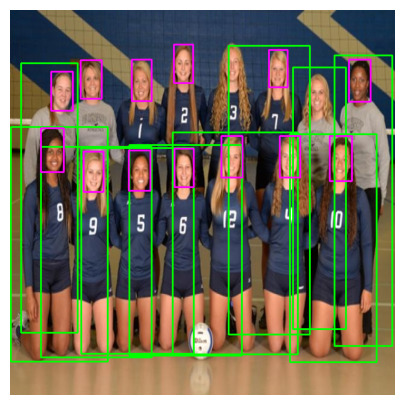

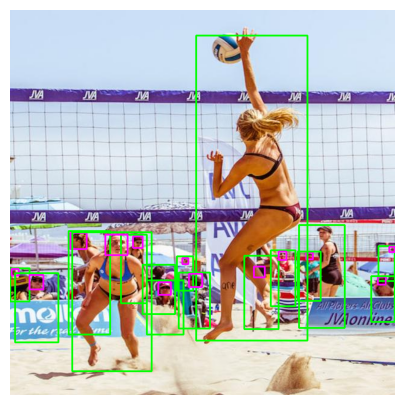

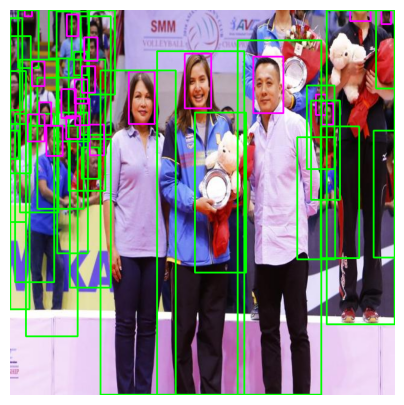

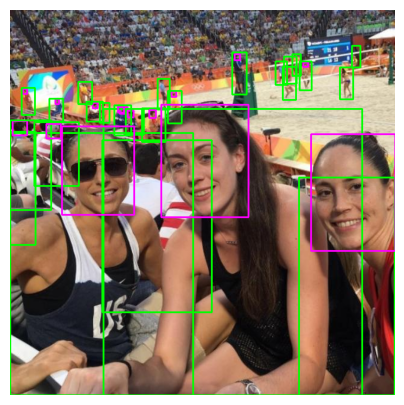

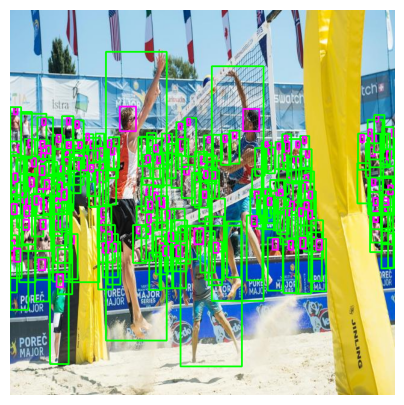

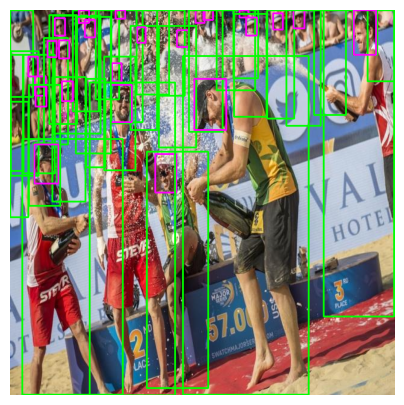

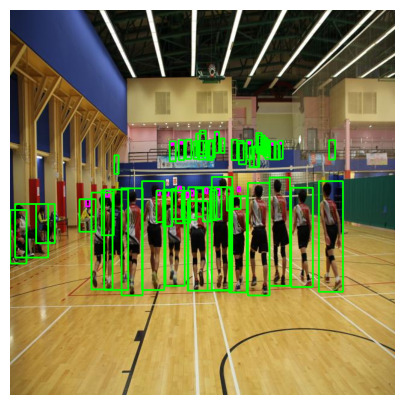

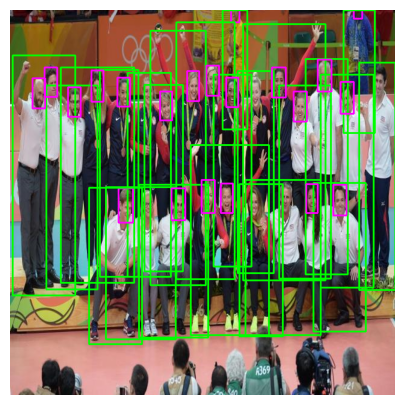

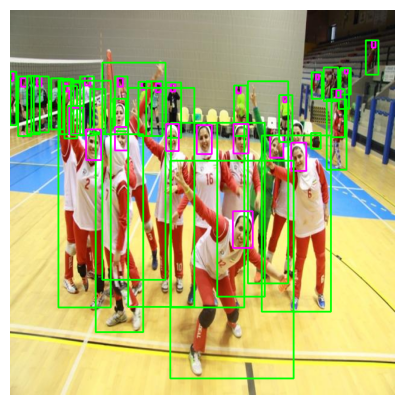

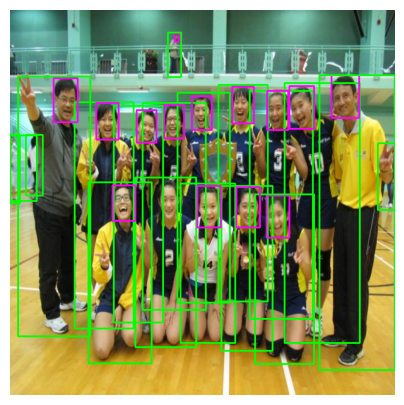

In [9]:
# Helper function to display an image with bounding box
def display_image(image_path,figure_size=(6, 6), label_path = False):
    image = cv2.imread(image_path)
    # Verify the image is loaded correctly
    if image is None:
        print(f"Error: Unable to load image {image_path}")
        return

    # Convert the image to uint8 if necessary
    if image.dtype != 'uint8':
        image = (image * 255).astype('uint8')

    image_height, image_width = image.shape[:2]
    
    if label_path:
    # Read the label
        with open(label_path, 'r') as f:
            lines = f.readlines()
    
            # Parse each line in the label file
            for line in lines:
                values = line.strip().split()
                class_id = int(values[0])
                x_center = float(values[1])
                y_center = float(values[2])
                box_width = float(values[3])
                box_height = float(values[4])
                
                # Scale the bounding box
                center_x = int(x_center * image_width)
                center_y = int(y_center * image_height)
                width = int(box_width * image_width)
                height = int(box_height * image_height)
    
                # Calculate bounding box corners
                x_min = int(center_x - width / 2)
                y_min = int(center_y - height / 2)
                x_max = int(center_x + width / 2)
                y_max = int(center_y + height / 2)
    
                # Draw bounding box corners
                color = (0, 255, 0) if class_id == 1 else (255, 0, 255)
                thickness = 2
                cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color, thickness)
        
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=figure_size)
    plt.imshow(image)
    plt.axis("off")
    plt.show()

            
# trained_labels = os.path.join(train_label_dir, os.listdir(train_label_dir)[1])
trained_labels = [os.path.join(train_label_dir , each) for each in os.listdir(train_label_dir) if each.endswith('.txt') ]
trained_images = [os.path.join(train_images_dir , each) for each in os.listdir(train_images_dir) if each.endswith('.jpg') ]

for i, each in enumerate(trained_images[:10]):
    display_image(each, (5,5), trained_labels[i])

<h1>Train dataset using yolo model</h1>
<p>Train dataset using yolov8n dataset for 120 epochs, learning rate as 0.1, image size as 640 in gpu with cuda.</p>

In [ ]:

from ultralytics import YOLO

# Load the model
model = YOLO('yolov8s.yaml')  # You can also try yolov5n, yolov5m, etc.

train_results = model.train(
    data= os.path.join(dataset_dir, "data.yaml"),  # path to dataset YAML
    epochs=120,  # number of training epochs
    imgsz=640,  # training image size   
    device= 0 if is_gpu_available else "cpu",  # device to run on, i.e. device=0 or device=0,1,2,3 or device=cpu
    cache=False
)

New https://pypi.org/project/ultralytics/8.3.36 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.23  Python-3.10.15 torch-2.5.0+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
engine\trainer: task=detect, mode=train, model=yolov8s.yaml, data=c:\Users\susan\People-and-faces-detection-5\data.yaml, epochs=120, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train111, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, ret

train: Scanning C:\Users\susan\People-and-faces-detection-5\train\labels.cache... 1094 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1094/1094 [00:00<?, ?it/s]
val: Scanning C:\Users\susan\People-and-faces-detection-5\valid\labels.cache... 395 images, 0 backgrounds, 0 corrupt: 100%|██████████| 395/395 [00:00<?, ?it/s]


Plotting labels to runs\detect\train111\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train111
Starting training for 120 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/120      5.26G      4.111      3.121      3.983        255        640: 100%|██████████| 69/69 [00:21<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.60it/s]


                   all        395      10041    0.00391     0.0428    0.00347    0.00102

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/120      6.76G      3.419      2.533      3.271        302        640: 100%|██████████| 69/69 [00:21<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.28it/s]


                   all        395      10041      0.102     0.0974     0.0363     0.0117

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/120      5.52G      2.995      2.365      2.892        448        640: 100%|██████████| 69/69 [00:21<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.19it/s]


                   all        395      10041     0.0865     0.0772     0.0424     0.0135

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/120      5.85G      2.785      2.232      2.631         96        640: 100%|██████████| 69/69 [00:21<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.88it/s]

                   all        395      10041       0.21      0.191      0.103     0.0367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/120      5.83G      2.621      2.089      2.502        204        640: 100%|██████████| 69/69 [00:21<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.62it/s]

                   all        395      10041      0.252      0.334      0.252     0.0967



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/120       6.2G      2.415      1.917      2.348        146        640: 100%|██████████| 69/69 [00:21<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.82it/s]

                   all        395      10041      0.379      0.332      0.294      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/120      6.68G      2.295       1.82      2.224        131        640: 100%|██████████| 69/69 [00:21<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.76it/s]

                   all        395      10041      0.513      0.384      0.401      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/120      6.29G      2.158      1.718       2.12        290        640: 100%|██████████| 69/69 [00:21<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.85it/s]

                   all        395      10041      0.513      0.407       0.41      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/120      6.68G      2.099      1.662      2.042        171        640: 100%|██████████| 69/69 [00:21<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.45it/s]

                   all        395      10041      0.546      0.412      0.448      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/120      5.04G      1.993      1.571      1.964        146        640: 100%|██████████| 69/69 [00:21<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.59it/s]

                   all        395      10041      0.581      0.462      0.482      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/120      6.35G       1.97      1.561       1.94        231        640: 100%|██████████| 69/69 [00:21<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.53it/s]

                   all        395      10041      0.593      0.441      0.481       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/120      6.29G      1.918      1.548      1.891        103        640: 100%|██████████| 69/69 [00:21<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:10<00:00,  1.20it/s]

                   all        395      10041      0.614      0.493       0.54      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/120       6.5G      1.856      1.475      1.844        229        640: 100%|██████████| 69/69 [00:21<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.70it/s]


                   all        395      10041       0.65      0.509      0.566      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/120      5.58G      1.828       1.45      1.828        153        640: 100%|██████████| 69/69 [00:20<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.45it/s]

                   all        395      10041      0.664      0.528      0.587      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/120      6.91G      1.799       1.42      1.785        203        640: 100%|██████████| 69/69 [00:20<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.01it/s]

                   all        395      10041      0.639      0.536       0.58      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/120      5.79G      1.797      1.404      1.771        206        640: 100%|██████████| 69/69 [00:21<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.96it/s]

                   all        395      10041      0.685      0.536      0.601      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/120      6.48G      1.754       1.39      1.747        204        640: 100%|██████████| 69/69 [00:21<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:13<00:00,  1.05s/it]


                   all        395      10041      0.667      0.538      0.594      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/120      5.23G      1.732      1.361      1.714        206        640: 100%|██████████| 69/69 [00:21<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.92it/s]

                   all        395      10041      0.688       0.56      0.617      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/120      6.23G      1.691       1.33      1.689        373        640: 100%|██████████| 69/69 [00:21<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.88it/s]

                   all        395      10041      0.659      0.558      0.616      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/120      7.99G      1.691      1.325       1.69        152        640: 100%|██████████| 69/69 [00:21<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:18<00:00,  1.46s/it]

                   all        395      10041      0.662       0.56      0.613      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/120      6.56G      1.676      1.309      1.667        219        640: 100%|██████████| 69/69 [00:21<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.21it/s]

                   all        395      10041      0.704      0.557      0.627      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/120      5.23G      1.648      1.308      1.668        113        640: 100%|██████████| 69/69 [00:22<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.95it/s]

                   all        395      10041        0.7      0.562      0.627      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/120      5.83G      1.631      1.274      1.637        123        640: 100%|██████████| 69/69 [00:21<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.93it/s]

                   all        395      10041       0.71      0.584      0.647      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/120      6.72G      1.626      1.259      1.623        173        640: 100%|██████████| 69/69 [00:22<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.71it/s]

                   all        395      10041      0.728      0.592      0.663      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/120      5.99G      1.592      1.229        1.6        192        640: 100%|██████████| 69/69 [00:21<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.82it/s]

                   all        395      10041      0.725      0.589      0.659      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/120      6.46G      1.598       1.24      1.607        197        640: 100%|██████████| 69/69 [00:22<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.74it/s]

                   all        395      10041      0.719      0.614      0.675      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/120      5.61G      1.568      1.233      1.592        121        640: 100%|██████████| 69/69 [00:21<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.88it/s]

                   all        395      10041      0.721      0.587      0.653      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/120      6.27G      1.532      1.189      1.564        169        640: 100%|██████████| 69/69 [00:21<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.53it/s]


                   all        395      10041      0.737      0.598      0.674      0.392

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/120      6.21G      1.558      1.199       1.58        155        640: 100%|██████████| 69/69 [00:21<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.83it/s]

                   all        395      10041      0.745      0.598       0.67      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/120      5.98G      1.534      1.175      1.552        249        640: 100%|██████████| 69/69 [00:21<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.12it/s]

                   all        395      10041      0.711      0.598      0.666      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/120      6.18G      1.511      1.179      1.555        172        640: 100%|██████████| 69/69 [00:22<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.71it/s]

                   all        395      10041      0.745      0.614      0.688      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/120      6.03G      1.516      1.161      1.537        284        640: 100%|██████████| 69/69 [00:22<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.19it/s]


                   all        395      10041      0.732      0.621      0.686      0.401

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/120      7.12G      1.527      1.165       1.55        253        640: 100%|██████████| 69/69 [00:23<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]

                   all        395      10041      0.741      0.624      0.698      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/120      5.77G      1.496      1.137       1.51        153        640: 100%|██████████| 69/69 [00:22<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.80it/s]

                   all        395      10041      0.738      0.629      0.695      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/120      5.77G      1.492      1.143      1.526        115        640: 100%|██████████| 69/69 [00:21<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.40it/s]

                   all        395      10041      0.749      0.625      0.695      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/120      6.68G       1.47       1.13      1.523        130        640: 100%|██████████| 69/69 [00:22<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:16<00:00,  1.26s/it]

                   all        395      10041       0.74      0.623      0.697      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/120      6.09G      1.479      1.132      1.512        335        640: 100%|██████████| 69/69 [00:22<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.71it/s]

                   all        395      10041      0.731       0.63      0.696      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/120      5.75G      1.467      1.119        1.5        165        640: 100%|██████████| 69/69 [00:21<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.56it/s]

                   all        395      10041      0.736      0.629      0.703      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/120      5.71G      1.463      1.124        1.5        242        640: 100%|██████████| 69/69 [00:21<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.77it/s]

                   all        395      10041      0.752      0.638      0.709      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/120      6.45G      1.434      1.084      1.476        210        640: 100%|██████████| 69/69 [00:22<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.66it/s]

                   all        395      10041      0.755      0.636      0.712      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/120      6.51G      1.466      1.109        1.5        264        640: 100%|██████████| 69/69 [00:21<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.42it/s]

                   all        395      10041      0.756       0.64      0.715      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/120      6.32G      1.426      1.081      1.476        201        640: 100%|██████████| 69/69 [00:21<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.87it/s]

                   all        395      10041      0.767      0.645      0.712      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/120      6.29G      1.431      1.094      1.485        151        640: 100%|██████████| 69/69 [00:21<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.91it/s]

                   all        395      10041      0.731      0.653      0.713      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/120      6.57G      1.424      1.067      1.469        177        640: 100%|██████████| 69/69 [00:21<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.22it/s]

                   all        395      10041      0.748      0.652      0.715      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/120      6.57G      1.415      1.058      1.459        238        640: 100%|██████████| 69/69 [00:21<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.62it/s]


                   all        395      10041      0.756      0.648      0.716      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/120      6.63G      1.421      1.074      1.465        234        640: 100%|██████████| 69/69 [00:21<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.71it/s]

                   all        395      10041      0.776      0.642      0.725      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/120      6.47G      1.402       1.07      1.464        116        640: 100%|██████████| 69/69 [00:21<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.95it/s]

                   all        395      10041      0.748      0.664       0.73      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/120      5.76G      1.392      1.052      1.459        113        640: 100%|██████████| 69/69 [00:21<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.90it/s]

                   all        395      10041      0.773      0.658       0.73      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/120      7.26G      1.407      1.048       1.45        333        640: 100%|██████████| 69/69 [00:21<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.99it/s]

                   all        395      10041      0.759      0.658      0.731      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/120      6.46G      1.393      1.035      1.438        305        640: 100%|██████████| 69/69 [00:21<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.96it/s]

                   all        395      10041      0.756      0.654      0.728      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/120      6.95G      1.399      1.056      1.452        275        640: 100%|██████████| 69/69 [00:21<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.95it/s]

                   all        395      10041      0.758      0.655      0.728       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/120      6.44G      1.394      1.038      1.452        314        640: 100%|██████████| 69/69 [00:21<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.27it/s]


                   all        395      10041      0.761      0.637      0.715      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/120      6.51G      1.368      1.027      1.424        423        640: 100%|██████████| 69/69 [00:21<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]

                   all        395      10041      0.761      0.655      0.729      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/120      7.26G      1.377       1.02      1.432        207        640: 100%|██████████| 69/69 [00:22<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.10it/s]

                   all        395      10041      0.777      0.649      0.733      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/120      6.33G      1.365      1.015      1.422        346        640: 100%|██████████| 69/69 [00:21<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.86it/s]

                   all        395      10041      0.769      0.661      0.738      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/120      5.56G      1.359      1.019      1.431        109        640: 100%|██████████| 69/69 [00:21<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.84it/s]

                   all        395      10041      0.764      0.663      0.734      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/120      6.06G      1.367      1.014      1.425        143        640: 100%|██████████| 69/69 [00:21<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.49it/s]

                   all        395      10041      0.771      0.662      0.739      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/120      5.84G      1.362      1.022      1.425        238        640: 100%|██████████| 69/69 [00:22<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.12it/s]

                   all        395      10041      0.764      0.671      0.743      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/120      6.94G      1.371      1.022      1.424        142        640: 100%|██████████| 69/69 [00:22<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:11<00:00,  1.17it/s]

                   all        395      10041      0.773      0.663      0.734      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/120       7.1G      1.353       1.01      1.415        177        640: 100%|██████████| 69/69 [00:22<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.54it/s]

                   all        395      10041      0.763      0.667      0.743      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/120      5.75G      1.349      1.005       1.41         87        640: 100%|██████████| 69/69 [00:22<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.75it/s]

                   all        395      10041      0.764      0.669      0.739      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/120      5.71G      1.327     0.9832      1.397        122        640: 100%|██████████| 69/69 [00:22<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.78it/s]

                   all        395      10041      0.776      0.668      0.738      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/120      6.82G       1.32     0.9773      1.396        113        640: 100%|██████████| 69/69 [00:22<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.80it/s]

                   all        395      10041      0.779       0.67      0.746      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/120      6.36G      1.324       0.98      1.391        206        640: 100%|██████████| 69/69 [00:21<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.54it/s]

                   all        395      10041      0.779       0.67      0.746       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/120      6.59G      1.337     0.9858      1.405        171        640: 100%|██████████| 69/69 [00:22<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.13it/s]

                   all        395      10041      0.773      0.682      0.752      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/120      6.41G      1.324     0.9848      1.399        113        640: 100%|██████████| 69/69 [00:22<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.92it/s]

                   all        395      10041      0.793      0.666      0.751      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/120      6.69G      1.325     0.9692      1.382        140        640: 100%|██████████| 69/69 [00:22<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.86it/s]

                   all        395      10041      0.775      0.678      0.745      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/120      6.67G       1.31     0.9601      1.379         95        640: 100%|██████████| 69/69 [00:22<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.91it/s]

                   all        395      10041       0.78      0.678      0.754      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/120      6.06G      1.305     0.9683      1.384        295        640: 100%|██████████| 69/69 [00:22<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.84it/s]

                   all        395      10041      0.777      0.679      0.754       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/120      5.43G      1.299     0.9491      1.374        108        640: 100%|██████████| 69/69 [00:22<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.87it/s]

                   all        395      10041       0.78       0.68      0.754      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/120      6.46G      1.311     0.9598      1.385        296        640: 100%|██████████| 69/69 [00:22<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.83it/s]

                   all        395      10041      0.782      0.679      0.753      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/120         6G      1.303     0.9455      1.372        209        640: 100%|██████████| 69/69 [00:22<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.82it/s]

                   all        395      10041      0.772      0.679      0.751      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/120      6.44G      1.308     0.9575      1.385        200        640: 100%|██████████| 69/69 [00:22<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.34it/s]

                   all        395      10041      0.789      0.672      0.754      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/120      6.99G      1.294     0.9481      1.374        212        640: 100%|██████████| 69/69 [00:22<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.56it/s]

                   all        395      10041      0.782      0.677      0.755      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/120      5.73G      1.277      0.948      1.363        239        640: 100%|██████████| 69/69 [00:22<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.83it/s]

                   all        395      10041      0.775      0.687      0.759      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/120      6.01G      1.286     0.9338      1.359        245        640: 100%|██████████| 69/69 [00:22<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.85it/s]

                   all        395      10041      0.793      0.661      0.749      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/120      7.14G      1.274     0.9305      1.358        180        640: 100%|██████████| 69/69 [00:22<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.03it/s]

                   all        395      10041      0.784      0.681      0.757      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/120      6.58G       1.26     0.9274       1.35        128        640: 100%|██████████| 69/69 [00:22<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.11it/s]

                   all        395      10041      0.788      0.684      0.759       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/120      5.86G      1.266     0.9353      1.359        284        640: 100%|██████████| 69/69 [00:22<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.81it/s]

                   all        395      10041      0.796      0.669      0.755      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/120      5.57G      1.266     0.9387      1.358        122        640: 100%|██████████| 69/69 [00:21<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.87it/s]

                   all        395      10041       0.79      0.672      0.755      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/120      7.06G      1.268     0.9343      1.359        167        640: 100%|██████████| 69/69 [00:22<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.91it/s]

                   all        395      10041      0.796      0.678      0.761      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/120      6.53G      1.281     0.9272      1.356        358        640: 100%|██████████| 69/69 [00:22<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.37it/s]

                   all        395      10041      0.788      0.682      0.761      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/120      6.14G       1.26     0.9199      1.346        229        640: 100%|██████████| 69/69 [00:21<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.93it/s]

                   all        395      10041      0.786      0.699      0.769      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/120       6.1G      1.254     0.9212      1.341        137        640: 100%|██████████| 69/69 [00:21<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.98it/s]

                   all        395      10041      0.786      0.694      0.767      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/120      6.24G      1.258     0.9239      1.351        141        640: 100%|██████████| 69/69 [00:21<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.92it/s]

                   all        395      10041      0.788      0.686      0.766      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/120      6.58G       1.26     0.9287      1.351        145        640: 100%|██████████| 69/69 [00:21<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.56it/s]

                   all        395      10041      0.789      0.691      0.767      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/120      6.13G      1.233      0.903      1.339        285        640: 100%|██████████| 69/69 [00:21<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.01it/s]

                   all        395      10041      0.797      0.691      0.768      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/120       6.2G      1.223     0.8927      1.325        263        640: 100%|██████████| 69/69 [00:21<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.95it/s]

                   all        395      10041      0.786       0.69      0.763       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/120      5.19G      1.237     0.9155      1.337        180        640: 100%|██████████| 69/69 [00:21<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.94it/s]

                   all        395      10041      0.788      0.693      0.768      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/120      6.24G      1.217     0.8915      1.331        235        640: 100%|██████████| 69/69 [00:21<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.38it/s]

                   all        395      10041      0.788      0.684      0.762      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/120      5.88G      1.239     0.8993      1.326        280        640: 100%|██████████| 69/69 [00:21<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.96it/s]

                   all        395      10041      0.798      0.692      0.776      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/120      6.48G      1.227     0.8925      1.327        190        640: 100%|██████████| 69/69 [00:21<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.51it/s]

                   all        395      10041       0.79      0.692      0.773      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/120      7.01G      1.211     0.8841      1.319        311        640: 100%|██████████| 69/69 [00:21<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.69it/s]

                   all        395      10041       0.79      0.699       0.77        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/120      5.66G      1.228     0.8937      1.324        589        640: 100%|██████████| 69/69 [00:21<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.96it/s]

                   all        395      10041      0.797      0.697      0.772      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/120       5.7G      1.218     0.8911      1.327        153        640: 100%|██████████| 69/69 [00:21<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.43it/s]

                   all        395      10041       0.79      0.689      0.765      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/120      6.05G      1.206     0.8818      1.311        228        640: 100%|██████████| 69/69 [00:21<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.73it/s]

                   all        395      10041      0.799      0.688      0.769        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/120       6.9G       1.21     0.8846      1.323        256        640: 100%|██████████| 69/69 [00:21<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.41it/s]

                   all        395      10041      0.802      0.692      0.772      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/120      5.66G      1.208     0.8749       1.31        271        640: 100%|██████████| 69/69 [00:21<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.97it/s]

                   all        395      10041      0.793        0.7      0.775      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/120      6.59G      1.189     0.8714      1.314        201        640: 100%|██████████| 69/69 [00:21<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:13<00:00,  1.07s/it]

                   all        395      10041      0.794        0.7      0.771      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/120      6.48G      1.191     0.8616      1.299        127        640: 100%|██████████| 69/69 [00:21<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.23it/s]

                   all        395      10041      0.798       0.69      0.771      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/120      6.59G      1.195      0.862      1.302        210        640: 100%|██████████| 69/69 [00:21<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.66it/s]

                   all        395      10041      0.797      0.693      0.773      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/120      5.65G      1.199      0.863      1.301        228        640: 100%|██████████| 69/69 [00:21<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.88it/s]

                   all        395      10041      0.802      0.692      0.774      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/120      6.12G      1.198     0.8703        1.3        180        640: 100%|██████████| 69/69 [00:21<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.53it/s]


                   all        395      10041      0.801      0.698      0.776      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/120       7.1G      1.187     0.8602      1.301        159        640: 100%|██████████| 69/69 [00:23<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:12<00:00,  1.08it/s]

                   all        395      10041      0.803      0.693      0.776      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/120      5.57G      1.205      0.864      1.304        140        640: 100%|██████████| 69/69 [00:22<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.47it/s]

                   all        395      10041        0.8      0.701       0.78      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/120      7.78G      1.179     0.8467      1.297        183        640: 100%|██████████| 69/69 [00:22<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.58it/s]

                   all        395      10041        0.8        0.7      0.776      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/120      5.95G      1.187     0.8539      1.296        186        640: 100%|██████████| 69/69 [00:22<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.16it/s]

                   all        395      10041      0.802      0.704       0.78      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/120      6.41G      1.174     0.8556      1.294        148        640: 100%|██████████| 69/69 [00:21<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.77it/s]

                   all        395      10041      0.802      0.698      0.777      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/120      6.85G      1.182     0.8562      1.299        130        640: 100%|██████████| 69/69 [00:23<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.60it/s]

                   all        395      10041      0.797      0.701      0.776      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/120      7.35G      1.157     0.8389      1.281        274        640: 100%|██████████| 69/69 [00:22<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.03it/s]

                   all        395      10041      0.801      0.702      0.781      0.511


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/120      5.36G      1.107     0.7749       1.25         45        640: 100%|██████████| 69/69 [00:20<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.71it/s]

                   all        395      10041      0.809      0.692      0.778      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/120      5.45G      1.081     0.7527      1.233         84        640: 100%|██████████| 69/69 [00:20<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.95it/s]

                   all        395      10041      0.812      0.692      0.779      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/120      5.47G      1.085       0.75      1.237        178        640: 100%|██████████| 69/69 [00:21<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.80it/s]

                   all        395      10041        0.8        0.7      0.777      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/120      6.21G      1.073     0.7477      1.231        158        640: 100%|██████████| 69/69 [00:21<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.51it/s]

                   all        395      10041       0.81      0.695       0.78      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/120      6.41G      1.076     0.7489      1.227        110        640: 100%|██████████| 69/69 [00:21<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.36it/s]

                   all        395      10041      0.809      0.697       0.78      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/120      5.97G      1.077     0.7483      1.226        237        640: 100%|██████████| 69/69 [00:21<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.75it/s]

                   all        395      10041      0.801        0.7      0.782      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/120      6.46G      1.071     0.7389      1.224         97        640: 100%|██████████| 69/69 [00:21<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.55it/s]

                   all        395      10041      0.806      0.695       0.78      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/120      5.78G       1.06     0.7353      1.221         80        640: 100%|██████████| 69/69 [00:21<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  2.71it/s]

                   all        395      10041      0.802      0.703      0.782      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/120       5.4G      1.052     0.7295      1.217        125        640: 100%|██████████| 69/69 [00:21<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.50it/s]

                   all        395      10041      0.801      0.701      0.782      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/120      6.57G      1.061     0.7389      1.221        411        640: 100%|██████████| 69/69 [00:21<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.25it/s]

                   all        395      10041      0.806      0.697      0.782      0.513



120 epochs completed in 0.956 hours.
Optimizer stripped from runs\detect\train111\weights\last.pt, 22.5MB
Optimizer stripped from runs\detect\train111\weights\best.pt, 22.5MB

Validating runs\detect\train111\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.23  Python-3.10.15 torch-2.5.0+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
YOLOv8s summary (fused): 168 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.76it/s]


                   all        395      10041        0.8      0.704      0.782      0.515
                  head        367       3881      0.784      0.685      0.744      0.525
                person        395       6160      0.816      0.723      0.821      0.504
Speed: 0.2ms preprocess, 6.5ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs\detect\train111


<h1>Find the best model among all epochs and validate the model with valid data split</h1>

In [9]:
from ultralytics import YOLO
best_model = "C:/Users/susan/runs/detect/train111/weights/best.pt"
# Load the model
model = YOLO(best_model)

# Run the evaluation
results = model.val(data= os.path.join(dataset_dir, "data.yaml"))

Ultralytics 8.3.23  Python-3.10.15 torch-2.5.0+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
YOLOv8s summary (fused): 168 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning C:\Users\susan\People-and-faces-detection-5\valid\labels.cache... 395 images, 0 backgrounds, 0 corrupt: 100%|██████████| 395/395 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:07<00:00,  3.57it/s]


                   all        395      10041      0.802      0.704      0.783      0.515
                  head        367       3881      0.786      0.685      0.744      0.526
                person        395       6160      0.817      0.722      0.821      0.504
Speed: 0.8ms preprocess, 7.6ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to runs\detect\val114


<h1>Calculate performance matrices</h1>
<p>Calculate overall recall, precision, f1 score and accuracy of the best model</p>

In [10]:
# Access precision, recall, and F1 score from results.box
precision = results.box.p  # Likely represents precision
recall = results.box.r     # Likely represents recall
f1_score = results.box.f1   # Likely represents F1 score

# Print the metrics
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1_score}")


Precision: [    0.78607     0.81747]
Recall: [    0.68488      0.7224]
F1 Score: [    0.73199       0.767]


In [11]:
# Calculate overall metrics by taking the mean
overall_precision = precision.mean()
overall_recall = recall.mean()
overall_f1_score = f1_score.mean()
accuracy = results.box.map50   # Likely represents F1 score

print(f"Overall Precision: {overall_precision}")
print(f"Overall Recall: {overall_recall}")
print(f"Overall F1 Score: {overall_f1_score}")
print(f"Accuracy Score: {accuracy}")    

Overall Precision: 0.8017713240481794
Overall Recall: 0.7036388148053956
Overall F1 Score: 0.7494972480801076
Accuracy Score: 0.7828683442625904


<h1>Print confusion matrix and other matrices related to performance of the model</h1>

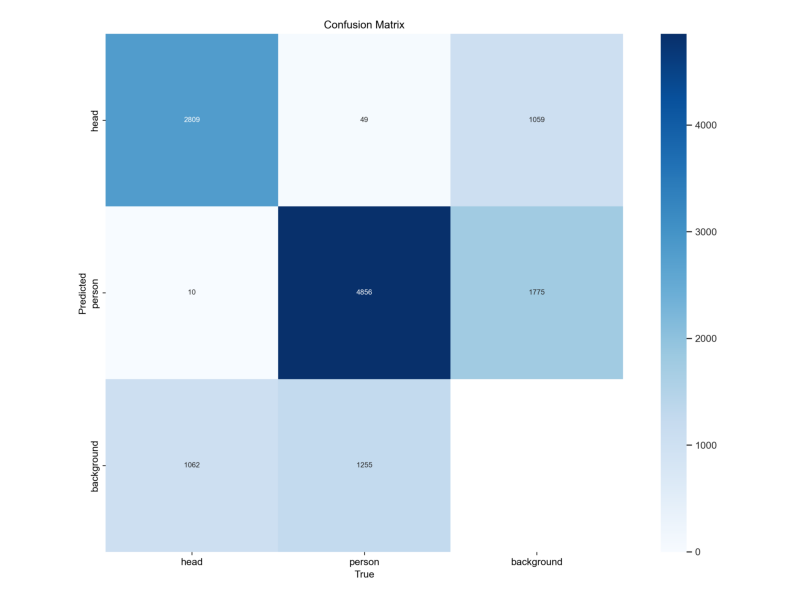

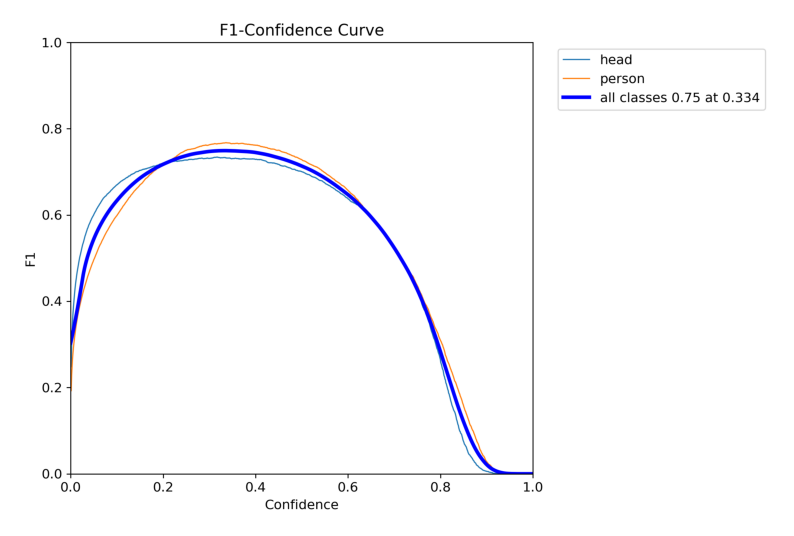

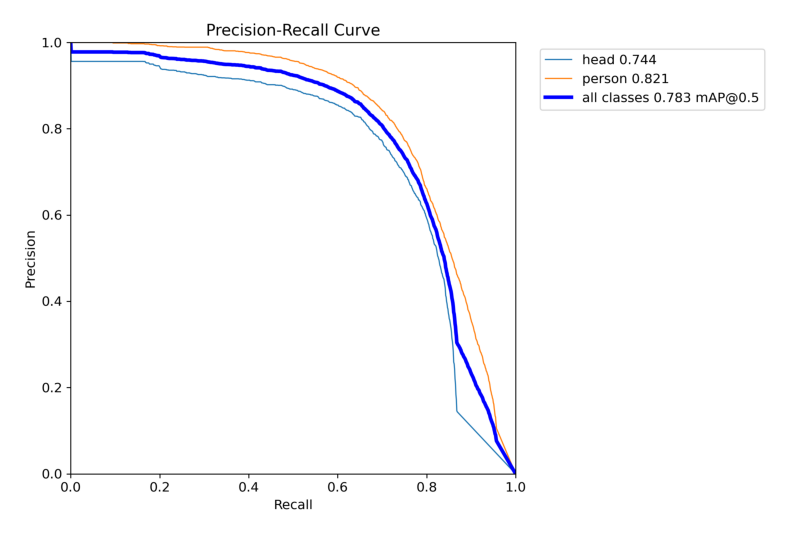

In [11]:
trained_model_path = os.path.join(current_dir, "runs", "detect", "val114")
confusion_matrix_path = os.path.join(trained_model_path, "confusion_matrix.png")
f1_curve_path = os.path.join(trained_model_path, "F1_curve.png")
PR_curve_path = os.path.join(trained_model_path, "PR_curve.png")

result_charts = [confusion_matrix_path, f1_curve_path, PR_curve_path]

values = [display_image(image_path, (10, 10)) for image_path in result_charts]

<h1>Predict the model with test data split</h1>

In [37]:
test_dataset = os.path.join(dataset_dir, "test")
test_image_dataset = os.path.join(test_dataset, "images")
test_results = model.predict(source=test_image_dataset, save=True)


image 1/391 c:\Users\susan\People-and-faces-detection-5\test\images\273271-1a51000317893a5_jpg.rf.812116ba79928aa60a68c4d64b69cb14.jpg: 640x640 22 heads, 22 persons, 40.5ms
image 2/391 c:\Users\susan\People-and-faces-detection-5\test\images\273271-1c38400082fe3cd1_jpg.rf.163e1564aca5370581783215bdf26f4d.jpg: 640x640 6 heads, 6 persons, 40.6ms
image 3/391 c:\Users\susan\People-and-faces-detection-5\test\images\273271-1ddda0001685370d_jpg.rf.ad16da81b4e4336aa328c6a88ca5f59c.jpg: 640x640 9 heads, 9 persons, 42.6ms
image 4/391 c:\Users\susan\People-and-faces-detection-5\test\images\273271-1e0c4000f02e9474_jpg.rf.57a51f895d229df1d4409e1197bfd696.jpg: 640x640 5 heads, 5 persons, 41.0ms
image 5/391 c:\Users\susan\People-and-faces-detection-5\test\images\273271-1e0f1000dc77434d_jpg.rf.b2b9135c78ecec75bcf2f2ac600fd51d.jpg: 640x640 7 heads, 21 persons, 42.2ms
image 6/391 c:\Users\susan\People-and-faces-detection-5\test\images\273271-1e5ef000a7387719_jpg.rf.6c8e3354039788930ad7d23f5f404ffb.jpg: 

<h1>Display test data images with their predicted bounding box</h1>

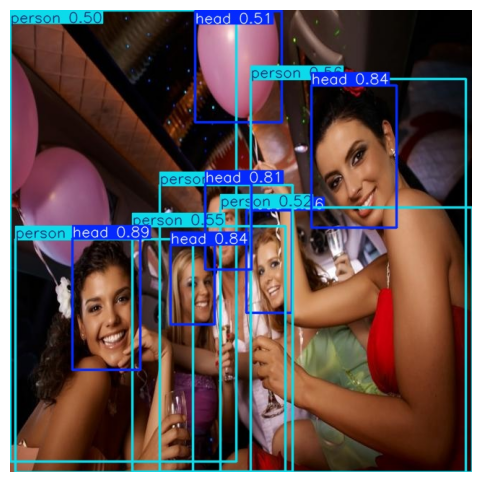

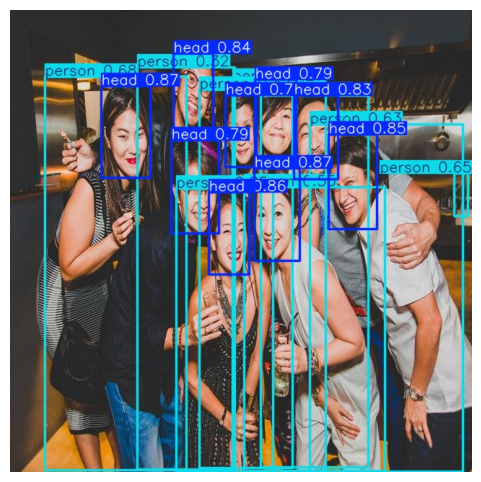

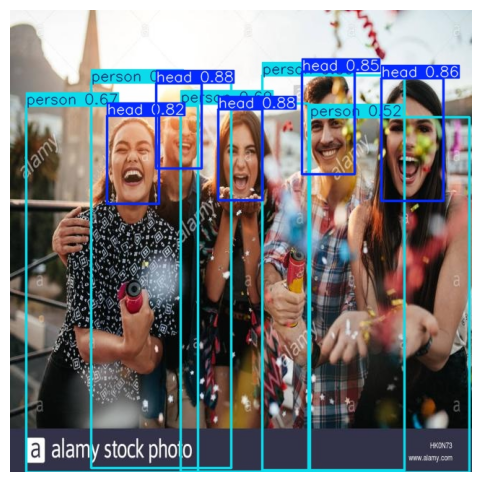

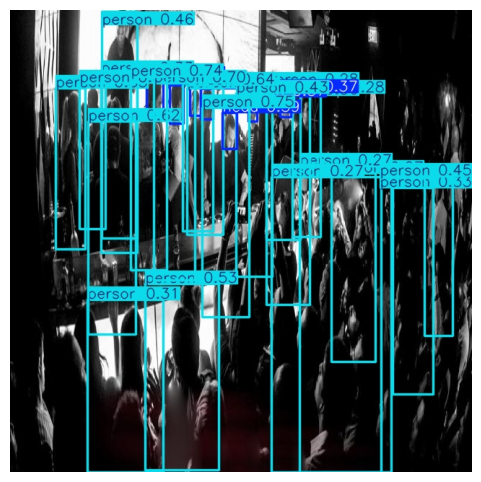

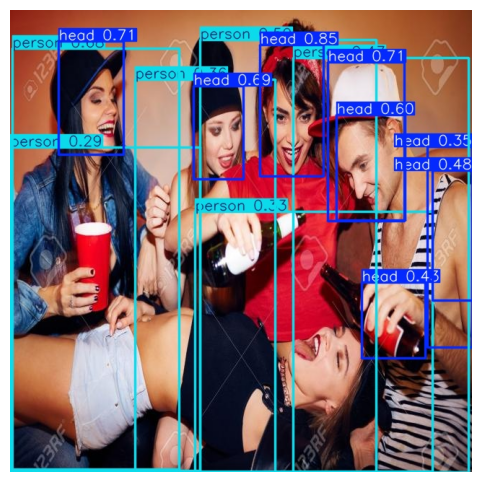

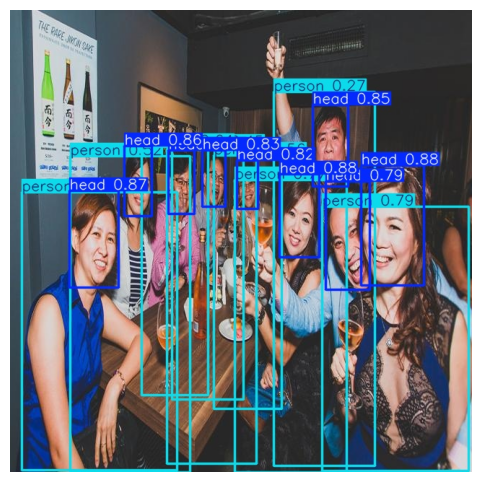

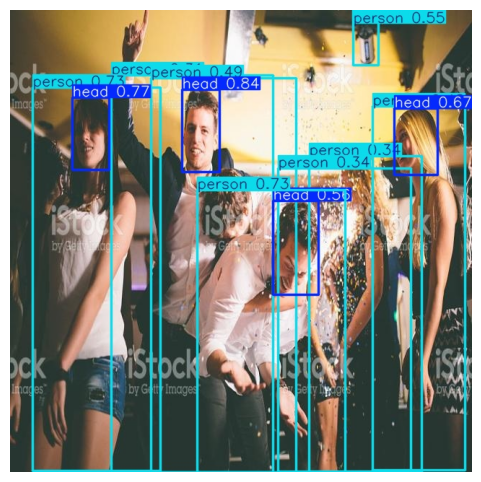

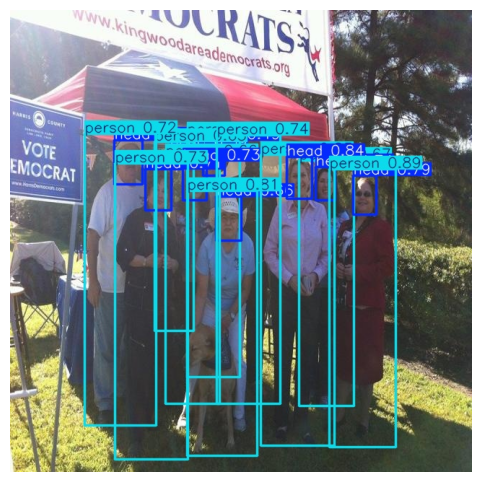

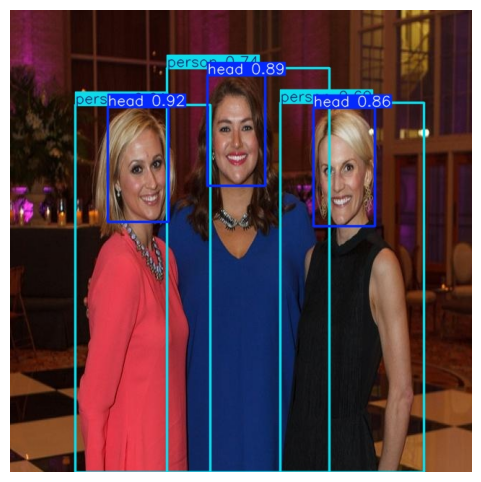

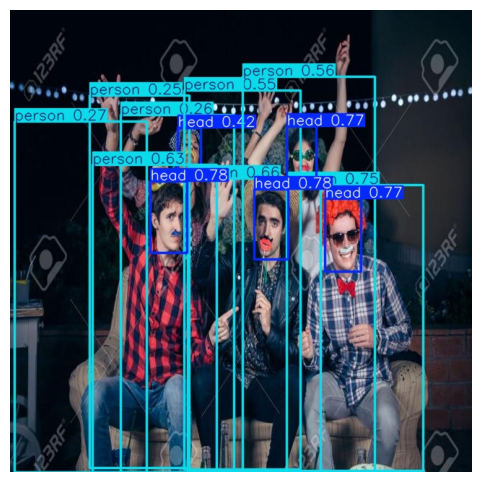

In [38]:
test_image_folder = test_results[0].save_dir
test_images = os.listdir(test_image_folder)
resp = [display_image(os.path.join(test_image_folder, test_image)) for test_image in test_images[1:11] ]

<h1>Validate the model for test data split and calculate accuracy</h1>

In [39]:
test_validation_results = model.val(data=os.path.join(dataset_dir, "data.yaml"), split="test")

Ultralytics 8.3.23  Python-3.10.15 torch-2.5.0+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)


val: Scanning C:\Users\susan\People-and-faces-detection-5\test\labels... 390 images, 1 backgrounds, 0 corrupt: 100%|██████████| 391/391 [00:00<00:00, 440.22it/s]

val: New cache created: C:\Users\susan\People-and-faces-detection-5\test\labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:08<00:00,  2.98it/s]


                   all        391      12417      0.776      0.721      0.763        0.5
                  head        376       5404      0.768      0.729      0.739      0.532
                person        390       7013      0.785      0.713      0.787      0.468
Speed: 0.4ms preprocess, 10.2ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs\detect\val98


In [53]:
# Access precision, recall, and F1 score from results.box
test_data_precision = test_validation_results.box.p  # Likely represents precision
test_data_recall = test_validation_results.box.r     # Likely represents recall
test_data_f1_score = test_validation_results.box.f1   # Likely represents F1 score

# Print the metrics
print(f"Precision: {test_data_precision}")
print(f"Recall: {test_data_recall}")
print(f"F1 Score: {test_data_f1_score}")


Precision: [    0.76753     0.78464]
Recall: [    0.72886     0.71325]
F1 Score: [     0.7477     0.74724]


In [55]:
# Calculate overall metrics by taking the mean
test_data_overall_precision = test_data_precision.mean()
test_data_overall_recall = test_data_recall.mean()
test_data_overall_f1_score = test_data_f1_score.mean()
test_data_accuracy = test_validation_results.box.map50   # Likely represents F1 score

print(f"Overall Precision: {test_data_overall_precision}")
print(f"Overall Recall: {test_data_overall_recall}")
print(f"Overall F1 Score: {test_data_overall_f1_score}")
print(f"Accuracy Score: {test_data_accuracy}")    

Overall Precision: 0.7760860825260756
Overall Recall: 0.7210559107949295
Overall F1 Score: 0.7474704583925875
Accuracy Score: 0.763200971354318


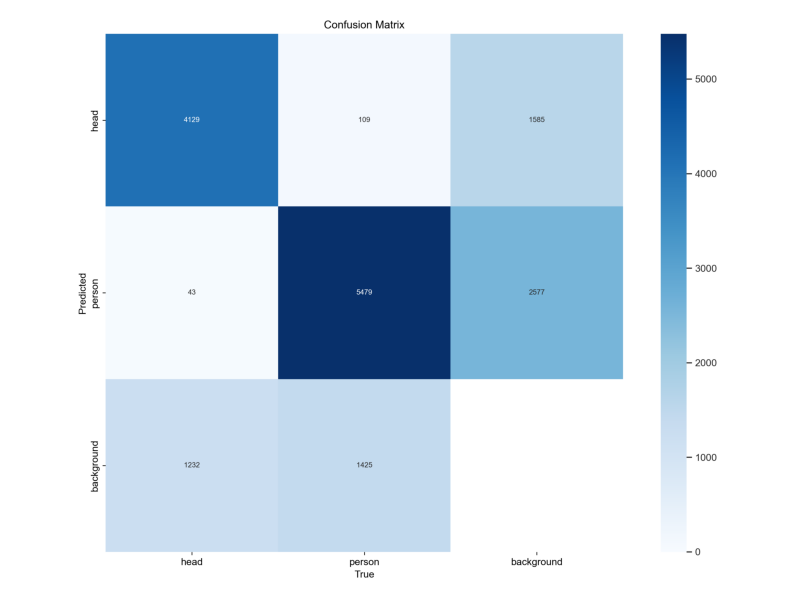

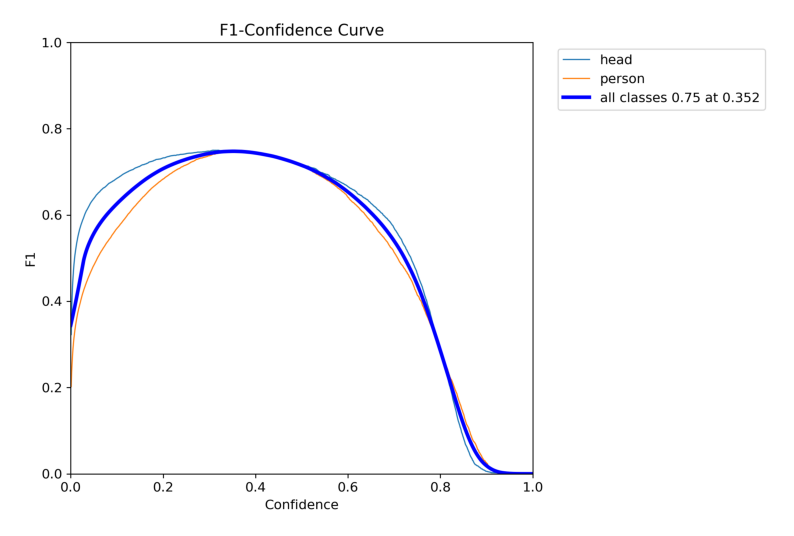

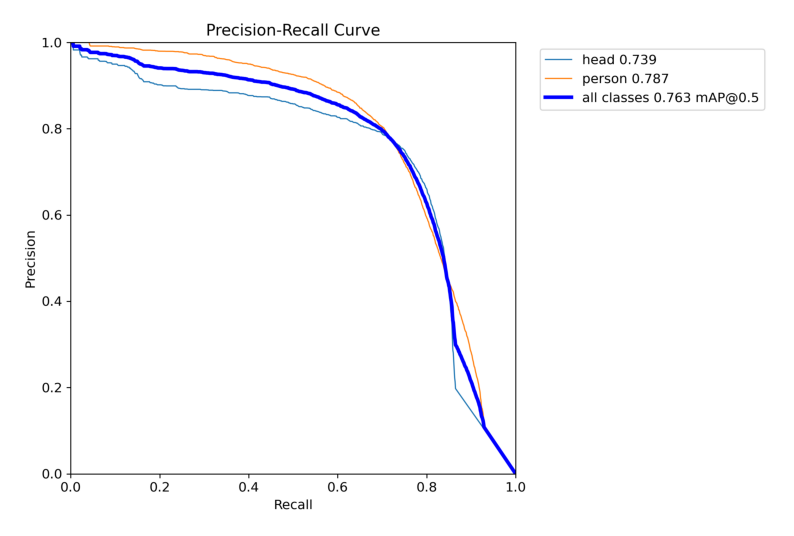

In [58]:
test_result_path = os.path.join(current_dir, "runs", "detect", "val98")
test_result_confusion_matrix_path = os.path.join(test_result_path, "confusion_matrix.png")
test_result_f1_curve_path = os.path.join(test_result_path, "F1_curve.png")
test_result_PR_curve_path = os.path.join(test_result_path, "PR_curve.png")

test_result_charts = [test_result_confusion_matrix_path, test_result_f1_curve_path, test_result_PR_curve_path]

values = [display_image(image_path, (10, 10)) for image_path in test_result_charts]

<h1>Use pre trained model using OpenImagesV7 dataset and yolo model</h1>
<p>use yolov8n-oiv7.pt as pre trained model and predict the test data split for human face, man and woman classes only as this project only detects head and person as classes</p>

In [48]:
pre_trained_model = YOLO("yolov8n-oiv7.pt")
test_results_with_pre_trained_model = pre_trained_model.predict(source=test_image_dataset, save=True,  classes=[264, 322, 594])



image 1/391 c:\Users\susan\People-and-faces-detection-5\test\images\273271-1a51000317893a5_jpg.rf.812116ba79928aa60a68c4d64b69cb14.jpg: 640x640 8 Human faces, 1 Man, 5 Womans, 39.5ms
image 2/391 c:\Users\susan\People-and-faces-detection-5\test\images\273271-1c38400082fe3cd1_jpg.rf.163e1564aca5370581783215bdf26f4d.jpg: 640x640 5 Human faces, 1 Man, 3 Womans, 35.1ms
image 3/391 c:\Users\susan\People-and-faces-detection-5\test\images\273271-1ddda0001685370d_jpg.rf.ad16da81b4e4336aa328c6a88ca5f59c.jpg: 640x640 9 Human faces, 2 Mans, 3 Womans, 33.0ms
image 4/391 c:\Users\susan\People-and-faces-detection-5\test\images\273271-1e0c4000f02e9474_jpg.rf.57a51f895d229df1d4409e1197bfd696.jpg: 640x640 5 Human faces, 4 Womans, 32.6ms
image 5/391 c:\Users\susan\People-and-faces-detection-5\test\images\273271-1e0f1000dc77434d_jpg.rf.b2b9135c78ecec75bcf2f2ac600fd51d.jpg: 640x640 (no detections), 30.5ms
image 6/391 c:\Users\susan\People-and-faces-detection-5\test\images\273271-1e5ef000a7387719_jpg.rf.6c

<h1>Display test data images with their predicted bounding box using pre trained model</h1>

runs\detect\predict23


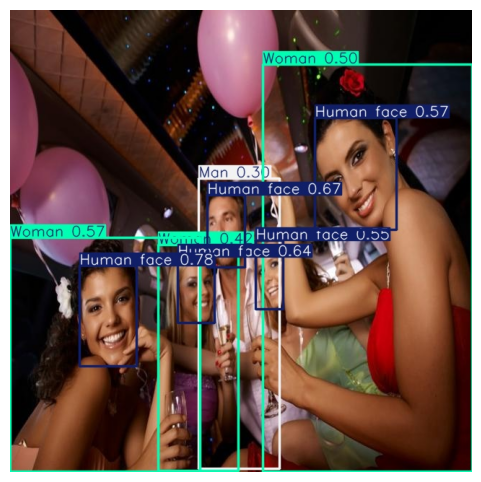

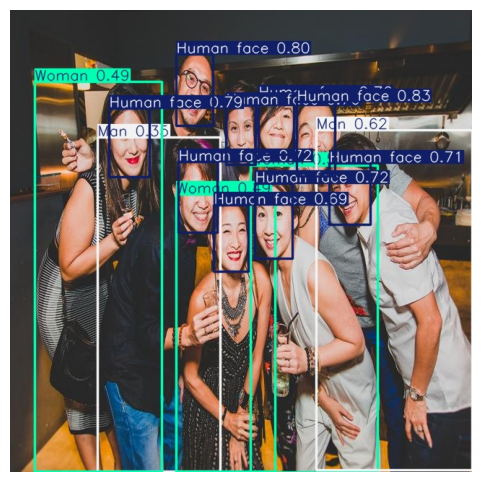

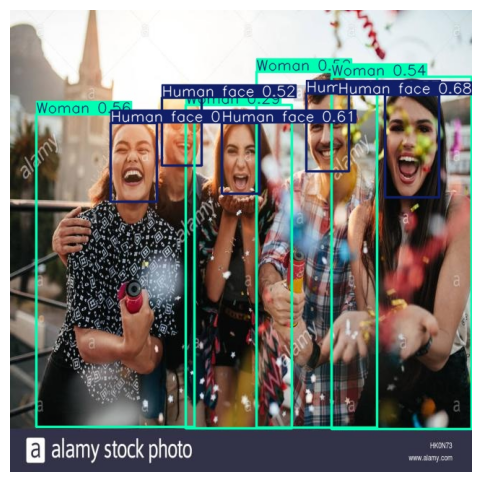

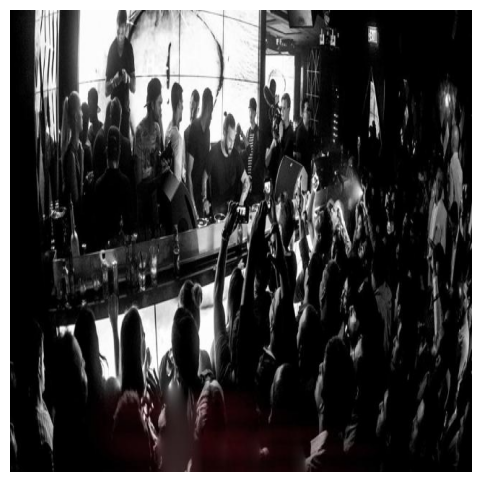

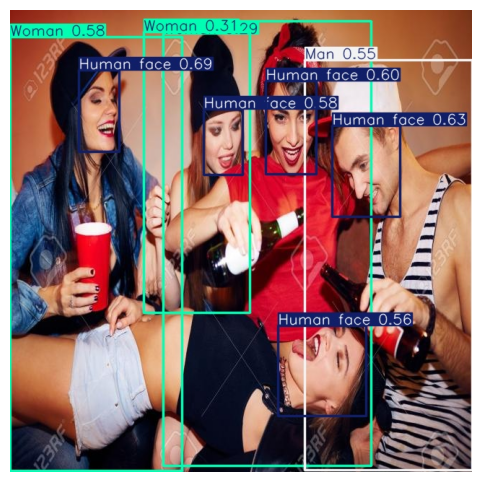

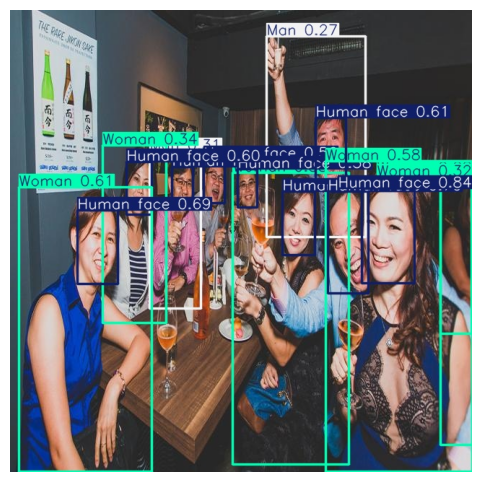

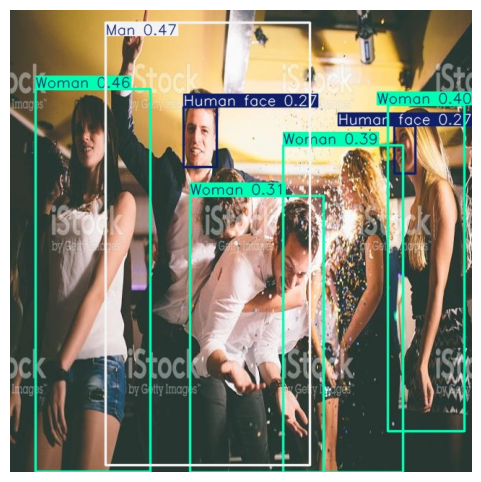

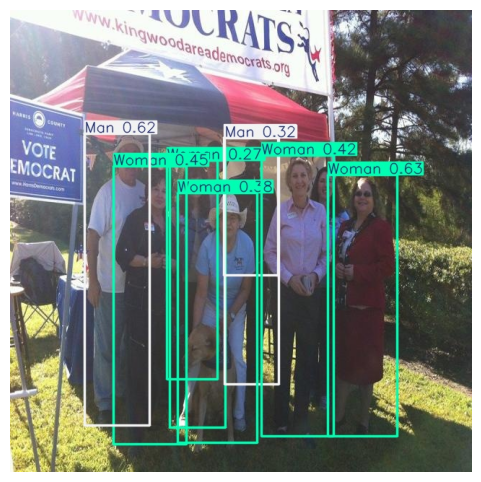

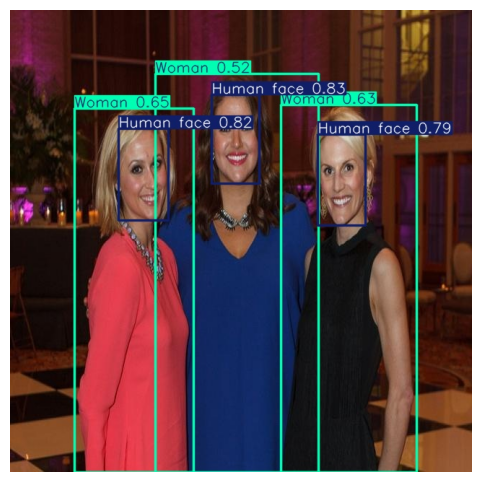

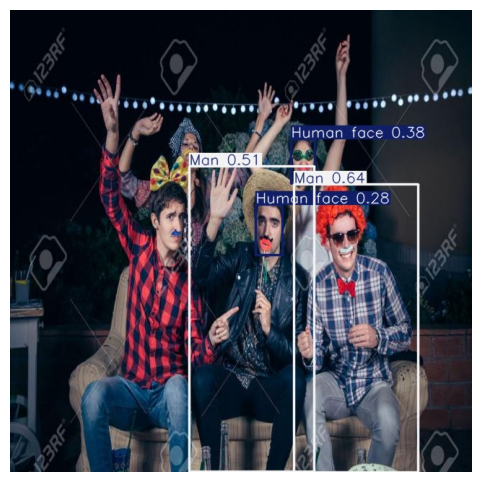

In [61]:
test_image_folder_with_pre_trained_model = test_results_with_pre_trained_model[0].save_dir
print(test_image_folder_with_pre_trained_model)
test_images_with_pre_trained_model = os.listdir(test_image_folder_with_pre_trained_model)
resp = [display_image(os.path.join(test_image_folder_with_pre_trained_model, test_image)) for test_image in test_images_with_pre_trained_model[1:11] ]

<h1>Perform real time object (face and person) detection using your best model </h1>

In [30]:
import math 
import time
# start webcam
cap = cv2.VideoCapture(0)
if not cap.isOpened():
    print("Error: Could not access the camera.")

cap.set(3, 1280) #Set width of camera
cap.set(4, 720) #Set height of camera


# object classes
classNames = ["head", "person"]

#get current time
current_time = time.time()
while time.time() - current_time < 10:
    success, img = cap.read()
    results = model(img, stream=True)

    # coordinates
    for r in results:
        boxes = r.boxes
        for box in boxes:
            # bounding box
            x1, y1, x2, y2 = box.xyxy[0]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2) # convert to int values

            # put box in cam
            
            color = (0, 255, 0) if box.cls[0] == 1 else (255, 0, 255)
            cv2.rectangle(img, (x1, y1), (x2, y2), color, 3)

            # confidence
            confidence = math.ceil((box.conf[0]*100))/100
            print("Confidence --->",confidence)

            # class name
            cls = int(box.cls[0])
            print("Class name -->", classNames[cls])

            # object details
            org = [x1, y1]
            font = cv2.FONT_HERSHEY_SIMPLEX
            fontScale = 1
            color = (255, 0, 0)
            thickness = 2
            text = classNames[cls] +" " + str(confidence)
            cv2.putText(img, text, org, font, fontScale, color, thickness)

    cv2.imshow('Webcam', img)
    if cv2.waitKey(1) == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()



0: 384x640 2 heads, 2 persons, 7.7ms
Confidence ---> 0.89
Class name --> person
Confidence ---> 0.84
Class name --> head
Confidence ---> 0.82
Class name --> head
Confidence ---> 0.59
Class name --> person
Speed: 1.0ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 heads, 2 persons, 10.5ms
Confidence ---> 0.85
Class name --> person
Confidence ---> 0.84
Class name --> head
Confidence ---> 0.83
Class name --> head
Confidence ---> 0.58
Class name --> person
Speed: 2.0ms preprocess, 10.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 heads, 2 persons, 11.1ms
Confidence ---> 0.82
Class name --> head
Confidence ---> 0.82
Class name --> head
Confidence ---> 0.81
Class name --> person
Confidence ---> 0.6
Class name --> person
Speed: 1.0ms preprocess, 11.1ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 heads, 2 persons, 6.5ms
Confidence ---> 0.84
Class name --> person
Confidence